# Uber Pickups - Abril
___

Dataset contém mais de 4.5 milhões de chamadas pelo app Uber entre abril e setembro de 2014.

Os datasets contém dados de cada viagem, com dia/hora, latitude, longitude, e a base.

Este notebook contém apenas EDA do mês de abril.

Dataset: https://www.kaggle.com/fivethirtyeight/uber-pickups-in-new-york-city

In [95]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import *
import holidays
import warnings as wn

wn.filterwarnings('ignore')

plt.style.use('ggplot')

- Importar dataset de abril/2014, mostrando as 5 primeiras linhas e o tamanho do dataset:

In [96]:
april = pd.read_csv('Datasets/uber-raw-data-apr14.csv.zip', compression='zip')

In [97]:
april.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [98]:
print('Dataset contém',
    april.shape[0],'linhas e',
      april.shape[1],'colunas')

Dataset contém 564516 linhas e 4 colunas


### Limpeza dos dados

Checar tipos de variáveis, se existem valores nulos, etc.

- Checar os tipos das variáveis:

In [99]:
april.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564516 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  564516 non-null  object 
 1   Lat        564516 non-null  float64
 2   Lon        564516 non-null  float64
 3   Base       564516 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.2+ MB


- Passar a variável `Date/Time` para `datetime` do Pandas e `Base` para `str`:

In [100]:
april['Date/Time'] = pd.to_datetime(april['Date/Time'])

In [101]:
april['Base'] = april['Base'].astype(str)

- Checar valores nulos:

In [102]:
april.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

### Criar variáveis auxiliares

- Como as únicas informações que temos são ou temporais ou geográficas, vamos criar novas variáveis temporais pra auxiliar na análise, como a criação de uma tabela calendário:

In [103]:
def create_temp_vars(df,col):
    """Função para criação de novas variáveis temporais"""
    
    # mês
    df['month'] = df[col].dt.strftime('%B').values
    
    # dia do mês 
    df['day_of_month'] = df[col].dt.day.values
    
    # dia do mês por extenso
    df['day_of_month_x'] = df[col].dt.strftime('%A').values
    
    # dia da semana
    df['day_of_week'] = df[col].dt.weekday.values
    
    # hora
    df['hour'] = df[col].dt.hour.values
    
    return 'Variáveis criadas'

In [104]:
create_temp_vars(april,'Date/Time')

'Variáveis criadas'

- Mostrar 5 linhas:

In [105]:
april.head()

,Date/Time,Lat,Lon,Base,month,day_of_month,day_of_month_x,day_of_week,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,April,1,Tuesday,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,April,1,Tuesday,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,April,1,Tuesday,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,April,1,Tuesday,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,April,1,Tuesday,1,0


- Criar variável `is_holiday`:

In [106]:
us_holiday = holidays.US()
hdays = []

# se o dia for feriado == True
for i in range(april.shape[0]):
    if april.iloc[i,0] in us_holiday:
        hdays.append(True)
    else:
        hdays.append(False)

In [107]:
# se o dia é feriado, então ontem == True
for i in range(1,len(hdays)):
    if hdays[i] == True:
        hdays[i-1] == True
    else:
        pass

In [108]:
# checar dia anterior ao primeiro dia do dataset, e posterior ao último dia
if april.iloc[0]['Date/Time'] - timedelta(days=1) in us_holiday:
    hdays[0] == True
elif april.iloc[-1]['Date/Time'] + timedelta(days=1) in us_holiday:
    hdays[-1] == True

In [109]:
# mapear True e False para 1 e 0:
april['is_holiday'] = hdays

april['is_holiday'] = april['is_holiday'].map({True:1,False:0})

In [110]:
# nenhum feriado no mês
april['is_holiday'].value_counts()

0    564516
Name: is_holiday, dtype: int64

### EDA 

- Analisar as estatísticas do #_pickups por dia do mês:

In [111]:
april['day_of_month'].value_counts().describe()

count       30.000000
mean     18817.200000
std       5204.687744
min      11017.000000
25%      14876.500000
50%      18122.000000
75%      20686.000000
max      36251.000000
Name: day_of_month, dtype: float64

Nota-se uma média razoavelmente próxima da mediana. Entretanto, o valor máximo acima de $\mu+3\sigma$ nos diz que a distribuição é provavelmente assimétrica, com presença de outliers.

- Histograma e boxplot:

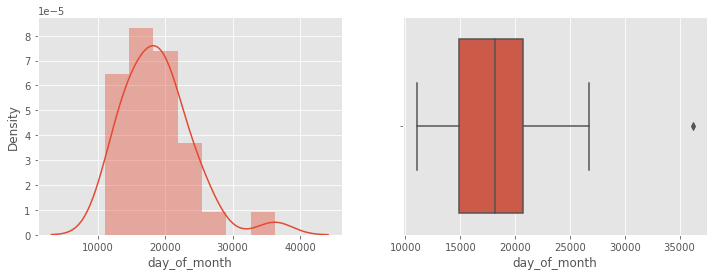

In [112]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
sns.distplot(april['day_of_month'].value_counts(),ax=ax[0])
sns.boxplot(april['day_of_month'].value_counts(),ax=ax[1]);

Observa-se pelos gráficos que, realmente, a distribuição da variável é assimétrica, com presença de um outlier acima do limite superior.

- #_pickups por dia do mês:

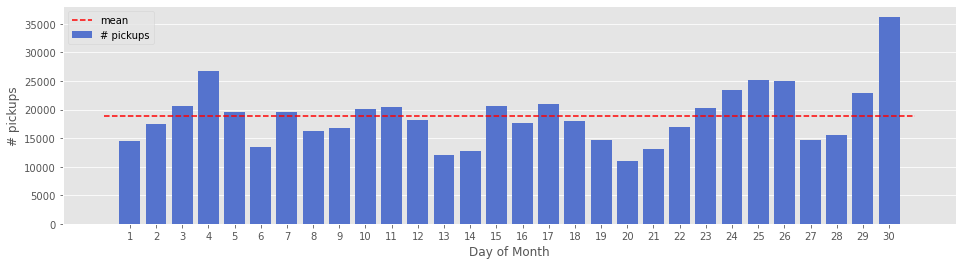

In [113]:
fig, ax = plt.subplots(figsize=(16,4))
sns.countplot(april['day_of_month'],color='royalblue',ax=ax)
ax.hlines(xmin=april['day_of_month'].unique().min()-2, xmax=april['day_of_month'].unique().max(),
           y=april['day_of_month'].value_counts().mean(), color='r', linestyle='--')
plt.xlabel('Day of Month')
plt.ylabel('# pickups')
plt.legend(['mean','# pickups']);

Nota-se que no último dia do mês, o #_pickups foi muito acima da média mensal, sendo, portanto, o outlier presente no boxplot. Aqui é necessário comentar que 01/may, ou seja, dia seguinte do outlier, é feriado internacional (Dia Internacinal do Trabalho). Portanto, é uma possível explicação para o aumento do # pickups, ainda que o feriado oficial seja em outra data.

Visualmente, 14 dias tiveram # pickups superior à média.

- Dia do mês mapeado por dia da semana:

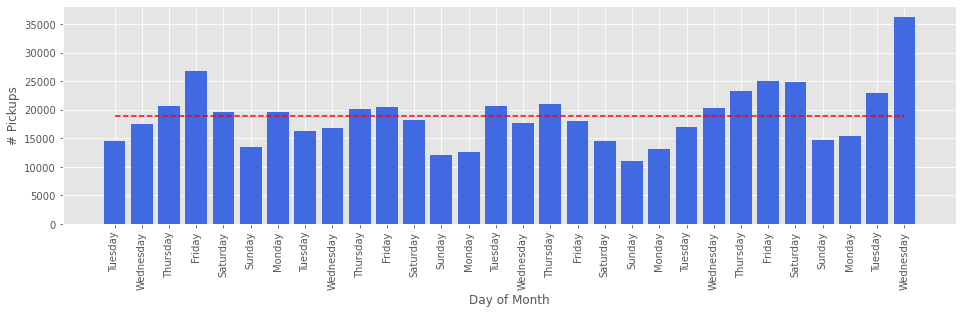

In [114]:
ind = april.groupby(['day_of_month','day_of_month_x']).count().reset_index()['day_of_month_x'].tolist()
fig, ax = plt.subplots(figsize=(16,4))
ax.hlines(xmin=april['day_of_month'].unique().min(), xmax=april['day_of_month'].unique().max(),
           y=april['day_of_month'].value_counts().mean(), color='r', linestyle='--')
ax.bar(april.groupby(['day_of_month','day_of_month_x']).count().reset_index()['day_of_month'],
        april.groupby(['day_of_month','day_of_month_x']).count().reset_index()['day_of_week'],
       color='royalblue')
ax.set_xticks(range(1,len(ind)+1))
ax.set_xticklabels(ind, rotation='vertical')
ax.set(xlabel='Day of Month',ylabel='# Pickups');

De maneira geral, analisando os dias da semana em relação à média:
- Monday: 1 acima e 2 abaixo da média
- Tuesday: 2 acima e 3 abaixo da média
- Wednesday: 2 acima e 3 abaixo da média
- Thursday: todos acima da média
- Friday: 3 acima e 1 abaixo da média
- Saturday: 2 acima e 1 abaixo da média
- Sunday: todos abaixo da média

- #_pickups por dia da semana:

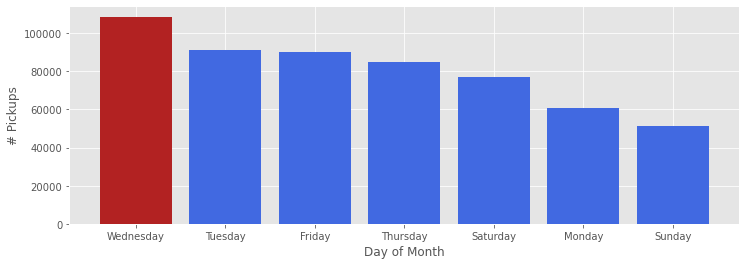

In [115]:
fig, ax = plt.subplots(figsize=(12,4))
color = ['firebrick','royalblue','royalblue','royalblue','royalblue','royalblue','royalblue']
ax.bar(april['day_of_month_x'].value_counts().index,
       april['day_of_month_x'].value_counts().values,
       color=color)
plt.xlabel('Day of Month')
plt.ylabel('# Pickups');

Observa-se que meio de semana possui um maior número de pedidos, e que quarta-feira, ainda que tenha ficado 3 dias abaixo da média mensal, foi o dia com maior #_pickups, devido à grande contagem no último dia do mês (outlier).\
Ademais, nota-se que segunda-feira possui um baixo número de pedidos, seguida pelo final de semana.

- Análise horária de #_pickups:

In [116]:
april.groupby(['day_of_month_x'])['hour'].describe()

,count,mean,std,min,25%,50%,75%,max
day_of_month_x,,,,,,,,
Friday,90303.0,15.067019,5.803299,0.0,11.0,16.0,20.0,23.0
Monday,60861.0,13.912506,5.502909,0.0,9.0,15.0,18.0,23.0
Saturday,77218.0,15.092543,6.552584,0.0,12.0,17.0,20.0,23.0
Sunday,51251.0,12.057755,6.907383,0.0,7.0,13.0,17.0,23.0
Thursday,85067.0,14.982590,5.558011,0.0,11.0,16.0,19.0,23.0
Tuesday,91185.0,14.486144,5.390425,0.0,10.0,16.0,19.0,23.0
Wednesday,108631.0,14.540886,5.387617,0.0,10.0,16.0,19.0,23.0


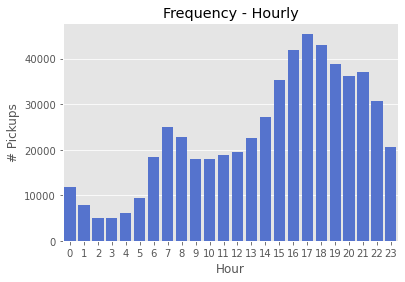

In [117]:
sns.countplot(april['hour'], color='royalblue')
plt.xlabel('Hour')
plt.ylabel('# Pickups')
plt.title('Frequency - Hourly');

O gŕafico de dist. de frequências acima demonstra uma bimodalidade, sendo que as viagens são mais frequentes no horário de saída do trabalho, com pico às 17:00, e um segundo pico no horário de entrada para o trabalho, às 7:00.\
Entretanto, a diferença entre entrada e saída do trabalho pode ser explicada pela utilização de outros meios de locomoção, como ônibus mas, principalmente, metrô.

- Dist. de frequências e boxplot por dia da semana:

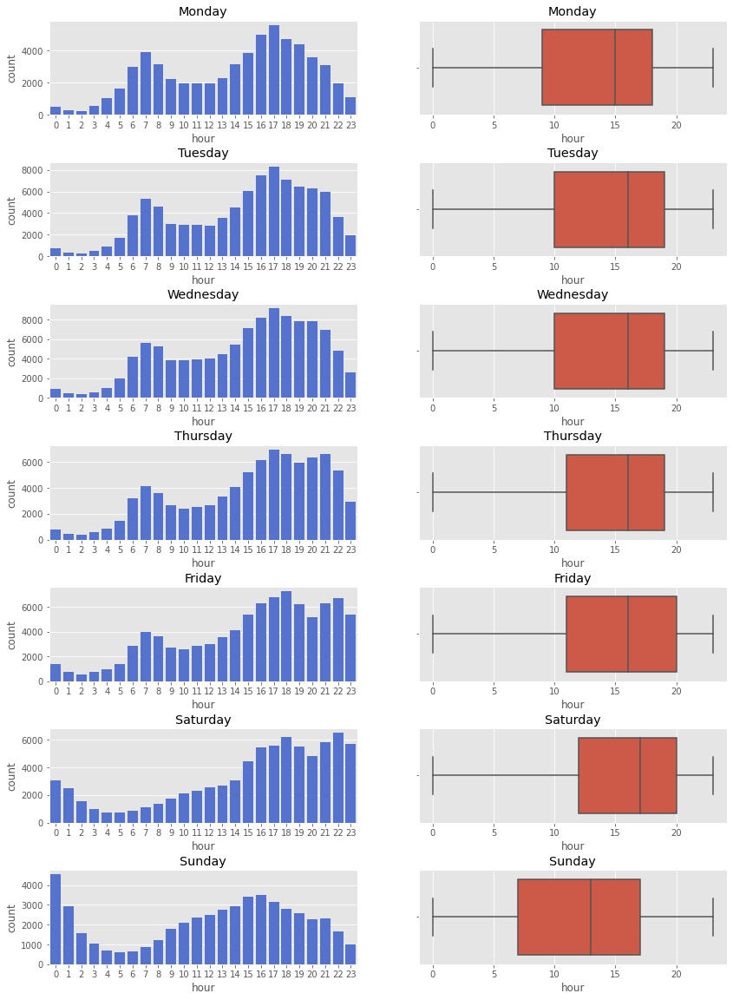

In [118]:
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

fig, axs = plt.subplots(7,2,figsize=(14,20))
plt.subplots_adjust(hspace=0.5)

axs = axs.ravel()

for i in range(len(days)):
    df_n = april[april['day_of_month_x']==days[i]]
    sns.countplot(df_n['hour'],ax=axs[2*i],color='royalblue')
    axs[2*i].set(title=days[i])
    sns.boxplot(df_n['hour'],ax=axs[2*i+1])
    axs[2*i+1].set(title=days[i])

Analisando primeiramente os boxplot, é interessante é notar que, excluindo domingo, com o passar da semana, IQR, ainda que permaneça praticamente inalterado, vai subindo em relação a hora i.e. Q1 sobe uma hora, e também Q3, com aumento dos traços inferiores e redução dos superiores, ou seja, as viagens vão se concentrando nas partes noturnas, aumentando a assimetria (calda) da distribuião à direita.

Entretanto, analisando a dist. de frequências observa-se que os dias de semana possuem distribuições relativamente semelhantes, com aspecto bimodal e picos em horários de entrada e saída do trabalho. \
Entretanto, sexta-feira, próximo ao final de semana, apresenta mais #_pickups em horários mais próximos à meia-noite, quando as pessoas começam a sair, fato comprovado pela madrugada de sábado, onde #_pickups é muito superior ao meio de semana.\
No sábado, os picos ocorrem no período noturno, quando as pessoas estão saindo, sendo complementada pelo retorno visto no domingo, onde o pico de viagens é também na madrugada.

- Análise geográfica:

In [119]:
# ver valores mínimos de latitude e longitude para dist.de frequências
print(april['Lat'].min(), april['Lat'].max(),
    april['Lon'].min(), april['Lon'].max())

40.0729 42.1166 -74.7733 -72.0666


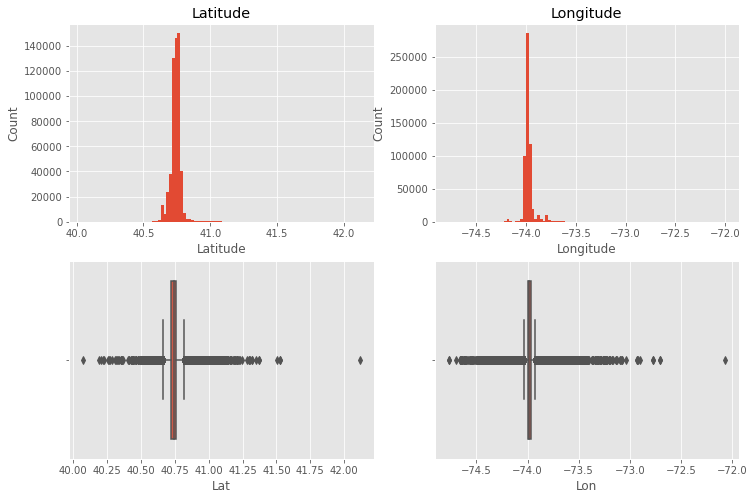

In [120]:
# gráficos de dist. frequências e boxplot
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(12,8))
ax1.hist(april['Lat'], bins=100, range=(40.05,42.12))
ax1.set(xlabel='Latitude', ylabel='Count', title='Latitude')
ax2.hist(april['Lon'], bins=100, range=(-74.78,-72.))
ax2.set(xlabel='Longitude', ylabel='Count', title='Longitude')
sns.boxplot(april['Lat'],ax=ax3)
sns.boxplot(april['Lon'],ax=ax4);

Pelo gráfico de distribuição de frequências nota-se que as viagens estão concentradas em um range pequeno, como é possível notar pelo boxplot, que possui Q1 muito próximo a Q3 e com grande presença de outliers. Portanto, grande parte das viagens se concentrou em determinado local da cidade.

- Mapa da cidade com pontos de viagens:

In [121]:
# valores de latitude e longitude - 25 em 25 para facilitar visualização devido à grande quantidade de pontos
lon = april['Lon'].tolist()
lat = april['Lat'].tolist()

lon = lon[0::25]
lat = lat[0::25]

In [122]:
import folium

# criar o mapa
ny = folium.Map(location=[40.79907391548583, -74.01095086976163],
               zoom_start=10)

In [123]:
# adicionar viagens iterativamente
for i in range(len(lon)):
    folium.Circle(location=[lat[i],lon[i]], color='crimson', 
                  fill=True, fill_color='crimson', radius=100).add_to(ny)

In [124]:
# mostrar gráfico
ny

Nota-se pelo gráfico que, como mencionado nos gráficos de latitude/longitude acima, as viagens ocorreram em grande maioria em uma região específica da cidade. Porém, é importante salientar também que diversos pontoss (possíveis outliers) podem ter ficado de fora do mapa devido à seleção (25 em 25 pontos).

- #_pickups por Base:

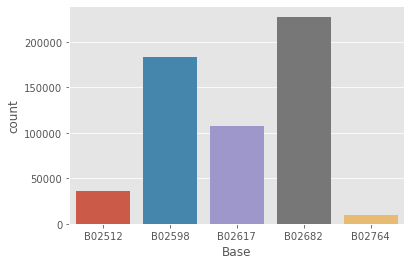

In [125]:
# contagem de viagens por base
sns.countplot(april['Base']);

Base `B02682` foi majoritária no mês de Abril, enquanto a base `B02764` teve pouquíssimas viagens. Talvez possa ter sido um fator mensal, como também regional.

- Mapa de viagens por base e latitude/longitude:

In [126]:
# seleciona as bases
bases = april['Base'].unique()
bases

array(['B02512', 'B02598', 'B02617', 'B02682', 'B02764'], dtype=object)

In [127]:
import folium

# criar o mapa
ny_bases = folium.Map(location=[40.79907391548583, -74.01095086976163],
               zoom_start=10)

In [128]:
# cores para 'B02512', 'B02598', 'B02617', 'B02682', 'B02764'
colors = ['firebrick','royalblue','darkviolet','darkgray','orange']

# adicionar viagens iterativamente
for i in range(len(bases)):
    df_n = april[april['Base']==bases[i]]
    lat_base = df_n['Lat'].tolist()
    lat_base = lat_base[0::25]
    lon_base = df_n['Lon'].tolist()
    lon_base = lon_base[0::25]
    for j in range(len(lon_base)):
        folium.Circle(location=[lat_base[j],lon_base[j]], color=colors[i], 
                      fill=True, fill_color=colors[i], radius=100).add_to(ny_bases)

In [129]:
# ny_bases

Pelo gráfico acima, aparentemente a base 'B02598' possui viagens em locais mais distantes do local de maior acúmulo de viagens. O mesmo pode ser observado pela presença de outliers nos boxplots abaixo.

Ademais, nota-se que as bases com maior presença de outliers foram também as bases com maior número de viagens, sendo que a base 'B02764' (menor número de viagens) teve sua concentração majoritária na região com maior presença de viagens e menor presença de outliers, indicando menor quantidade de viagens.

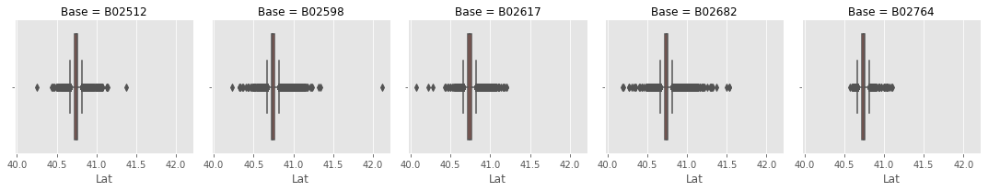

In [130]:
sns.FacetGrid(col='Base', data=april).map_dataframe(sns.boxplot,'Lat').add_legend();

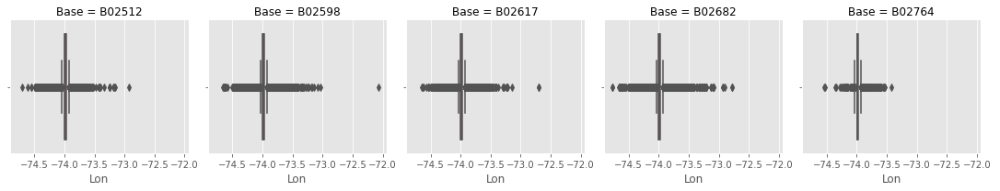

In [131]:
sns.FacetGrid(col='Base', data=april).map_dataframe(sns.boxplot,'Lon').add_legend();

- #_pickups por Base e dia da semana:

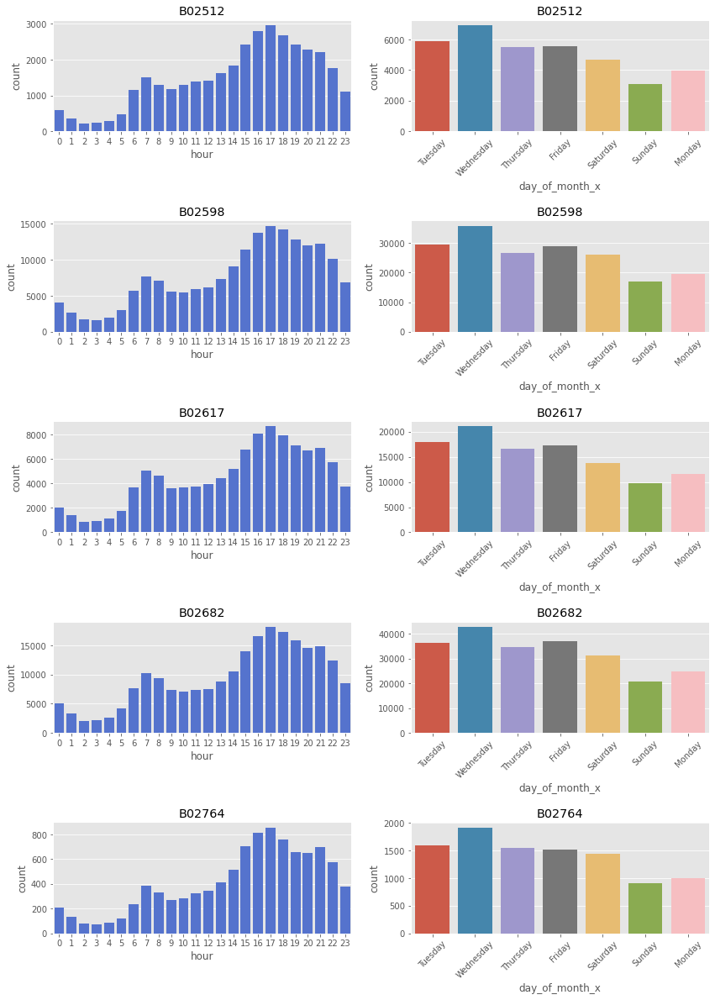

In [132]:
# dist. frequências e boxplot das bases
fig, axs = plt.subplots(5,2,figsize=(14,20))
plt.subplots_adjust(hspace=0.8)

axs = axs.ravel()

for i in range(len(bases)):
    df_n = april[april['Base']==bases[i]]
    sns.countplot(df_n['hour'],ax=axs[2*i],color='royalblue')
    axs[2*i].set(title=bases[i])
    sns.countplot(df_n['day_of_month_x'],ax=axs[2*i+1])
    axs[2*i+1].set(title=bases[i])
    axs[2*i+1].set_xticklabels(labels=df_n['day_of_month_x'].unique(),rotation=45)

Todas as bases tiveram um comportamento semelhante em relação à quantidade de viagens por horário e por dia da semana, com variação em magnitude (como apresentado anteriormente). Novamente, não existe variação aparente de caráter horário ou semanal para explicar a menor quantidade de viagens da base `B02764`.

- #_pickups por dia do mês:

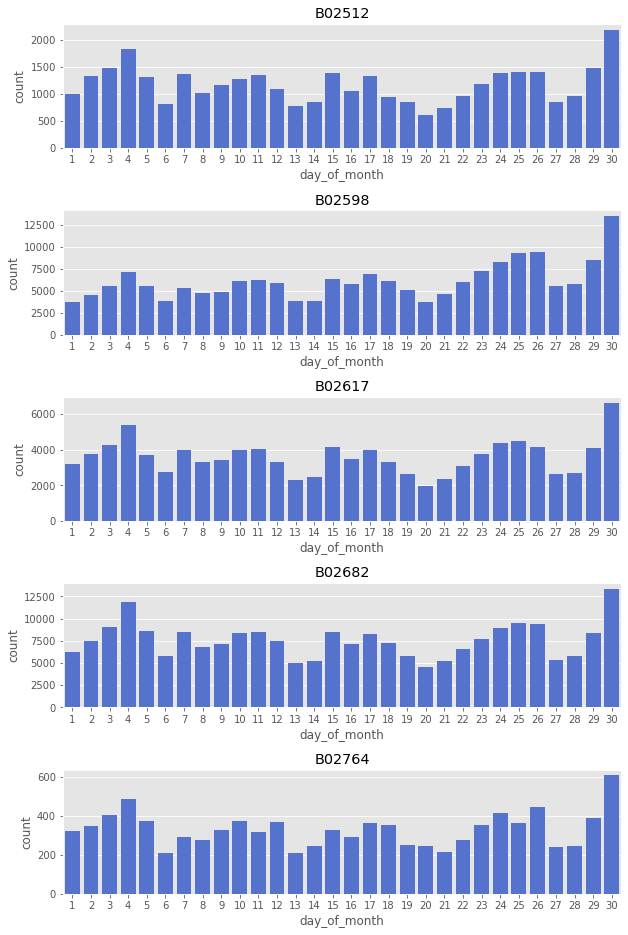

In [133]:
fig, axs = plt.subplots(5,1,figsize=(10,16))

plt.subplots_adjust(hspace=0.5)

axs = axs.ravel()

for i in range(len(bases)):
    df_n = april[april['Base'] == bases[i]]
    sns.countplot(df_n['day_of_month'], color='royalblue', ax=axs[i])
    axs[i].set_title(bases[i])

Novamente todas as bases apresentaram comportamentos semelhantes que impossibilitam reconhecimento de padrões para segmentação das quantidades de viagens por base.